In [1]:
%load_ext autoreload
%autoreload 2

# 1. Create dataset
Use Sam to extract proposals from input images (100 images) then for proposals with same regions as the ground truth masks, they are considered as positive sameple to the templates ( use the BlenderProc 42 templates), negative otherwise

Run through 100 images - then return positive proposals and negative proposals

Use IoU >0.5 to get the postive proposals

## 1.1 Extract positive proposals (the same ones as gt mask)

In [2]:
# from src.model.constrastive_learning import extract_dataset

# dataset="icbin"
# data_type="test"
# scene_id=1
# pos_proposals, neg_proposals = extract_dataset(dataset, data_type, scene_id) # Take 2.21 minutes

In [3]:
# from src.model.constrastive_learning import extract_dataset_train_pbr

# dataset = "icbin"
# data_type = "train_pbr"
# scene_id=1
# pos_proposals, neg_proposals = extract_dataset_train_pbr(dataset, data_type, scene_id) # Take 2.21 minutes

In [4]:
# # Only use crop form train_pbr not use sam proposals
# from src.model.constrastive_learning import extract_dataset_train_pbr_2

# dataset = "icbin"
# data_type = "train_pbr"
# scene_id=1
# pos_proposals, neg_proposals = extract_dataset_train_pbr_2(dataset, data_type, scene_id) # Take 2.21 minutes

In [5]:
# all_pos_proposals = [item for sublist in pos_proposals for item in sublist]
# all_neg_proposals = [item for sublist in neg_proposals for item in sublist]

In [6]:
# import matplotlib.pyplot as plt

# for i, neg in enumerate(neg_proposals[:50]):
#     plt.imshow(neg["rgb"])
#     plt.title(f"Image {i}")
#     plt.show()  # Displays each image one by one

In [7]:
# import pickle

# with open('contrastive_learning/train_pbr_pos_proposals_2.pkl', 'wb') as file:
#     pickle.dump(pos_proposals, file)

# with open('contrastive_learning/train_pbr_neg_proposals_2.pkl', 'wb') as file:
#     pickle.dump(neg_proposals, file)

In [8]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [9]:
import pickle


with open('contrastive_learning/train_pbr_pos_proposals_2.pkl', 'rb') as file:
    pos = pickle.load(file)

with open('contrastive_learning/train_pbr_neg_proposals_2.pkl', 'rb') as file:
    neg = pickle.load(file)

In [10]:
# import matplotlib.pyplot as plt
# import numpy as np

# for i in range(20):
#     plt.imshow(np.array(pos[i]["rgb"]))
#     plt.title(f"Image {i}")
#     plt.show()  # Displays each image one by one

## 1.2 Create positive and negative pairs
Positive pairs (positive proposal and template with most similar pose)

In [11]:
import torch

from src.model.constrastive_learning import ContrastiveModel


template_paths = "foundpose_analysis/icbin/templates/train_pbr_images_templates/obj_000001_original/*.png"
template_poses_path = "foundpose_analysis/icbin/templates/train_pbr_images_templates/obj_000001_original/poses.pkl"
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = ContrastiveModel(device)
# model.load_state_dict(torch.load("contrastive_learning/saved_checkpoints/model_checkpoint35.pth"))

Using cache found in /home/cuong.van-dam/.cache/torch/hub/facebookresearch_dinov2_main
/home/cuong.van-dam/.cache/torch/hub/facebookresearch_dinov2_main/dinov2/layers/swiglu_ffn.py:43: UserWarning: xFormers is available (SwiGLU)
  warnings.warn("xFormers is available (SwiGLU)")
/home/cuong.van-dam/.cache/torch/hub/facebookresearch_dinov2_main/dinov2/layers/attention.py:27: UserWarning: xFormers is available (Attention)
  warnings.warn("xFormers is available (Attention)")
/home/cuong.van-dam/.cache/torch/hub/facebookresearch_dinov2_main/dinov2/layers/block.py:33: UserWarning: xFormers is available (Block)
  warnings.warn("xFormers is available (Block)")
[2024-08-19 11:43:19,212] [INFO] dinov2: using MLP layer as FFN


In [12]:
from src.model.constrastive_learning import prepare_dataset
train_dataset, val_dataset, test_dataset, train_negative_pairs, train_postive_pairs = prepare_dataset(template_paths, template_poses_path, pos, neg)

[2024-08-19 11:43:22,971] [INFO] src.model.constrastive_learning: Size of neg proposal: (3, 92, 68)
[2024-08-19 11:43:22,974] [INFO] src.model.constrastive_learning: Size of neg proposal: (3, 170, 126)
[2024-08-19 11:43:22,976] [INFO] src.model.constrastive_learning: Size of neg proposal: (3, 86, 134)
[2024-08-19 11:43:22,978] [INFO] src.model.constrastive_learning: Size of neg proposal: (3, 147, 264)
[2024-08-19 11:43:22,980] [INFO] src.model.constrastive_learning: Size of neg proposal: (3, 72, 122)
[2024-08-19 11:43:22,982] [INFO] src.model.constrastive_learning: Size of neg proposal: (3, 77, 145)
[2024-08-19 11:43:22,984] [INFO] src.model.constrastive_learning: Size of neg proposal: (3, 65, 81)
[2024-08-19 11:43:22,986] [INFO] src.model.constrastive_learning: Size of neg proposal: (3, 48, 187)
[2024-08-19 11:43:22,987] [INFO] src.model.constrastive_learning: Size of neg proposal: (3, 54, 78)
[2024-08-19 11:43:22,989] [INFO] src.model.constrastive_learning: Size of neg proposal: (3, 

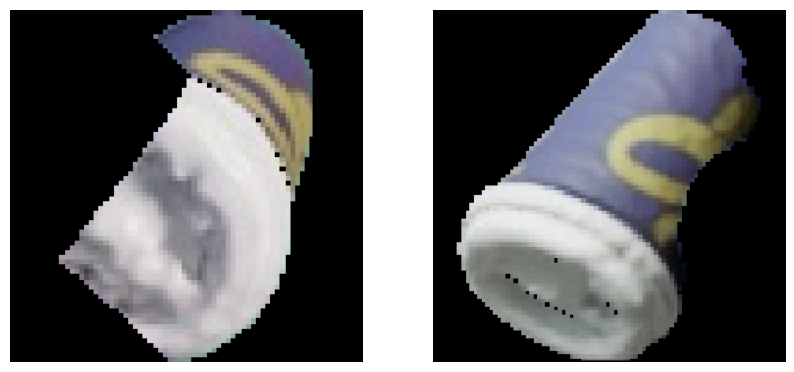

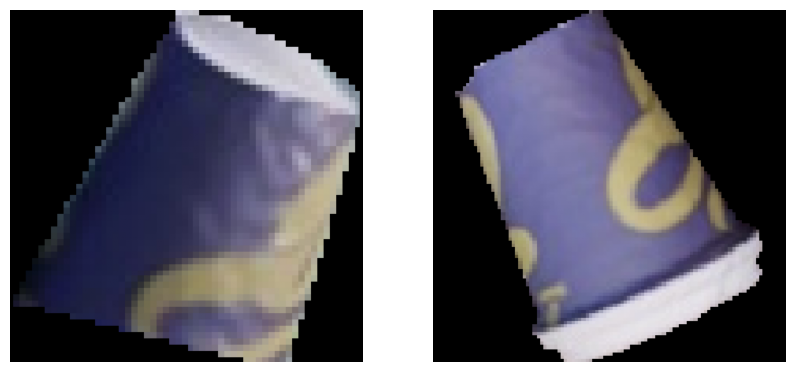

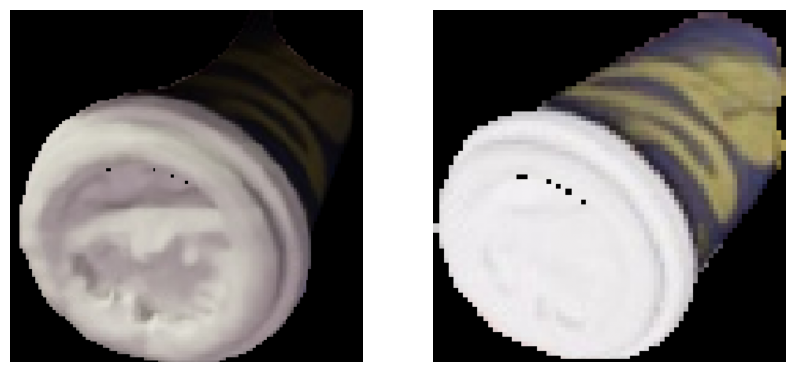

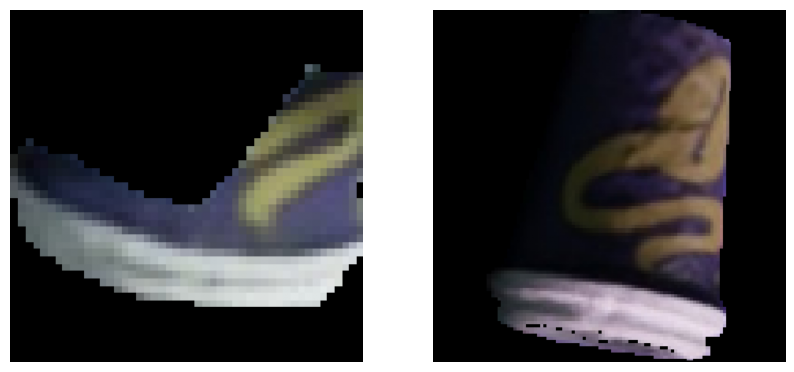

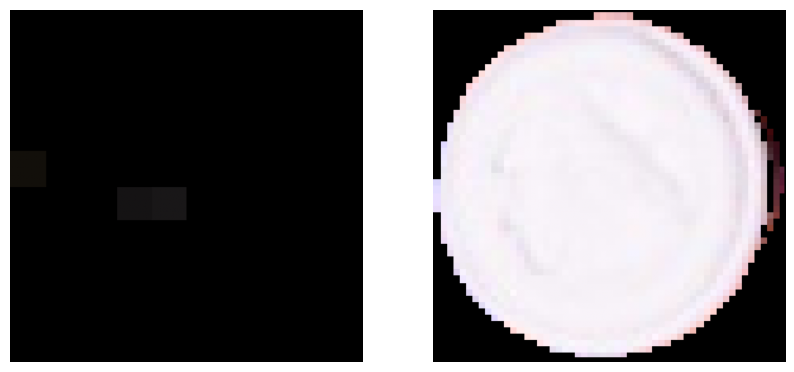

...

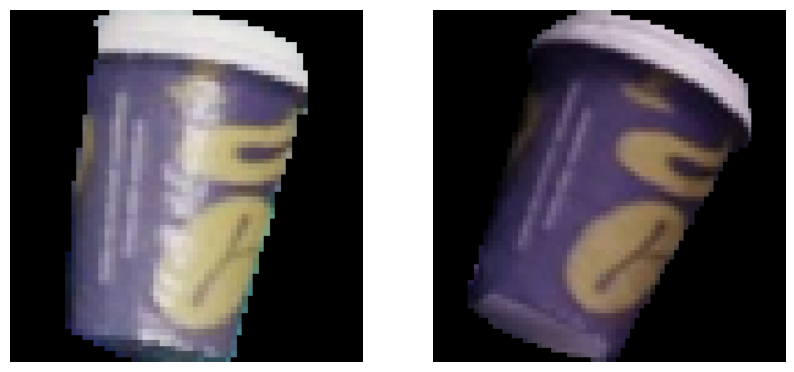

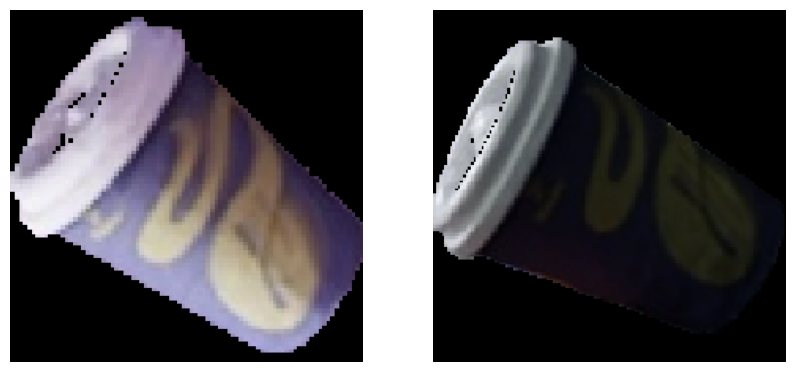

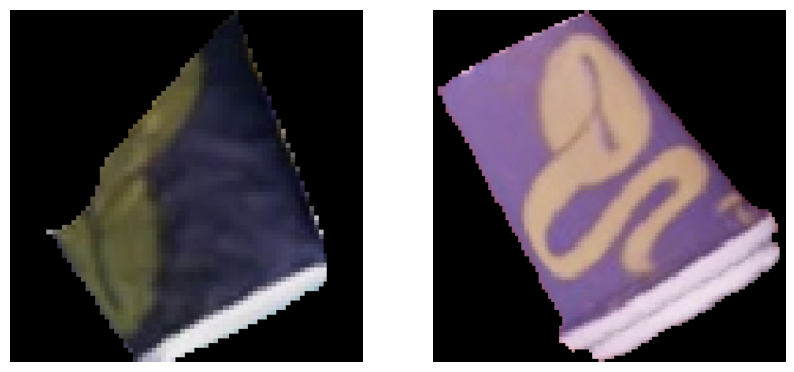

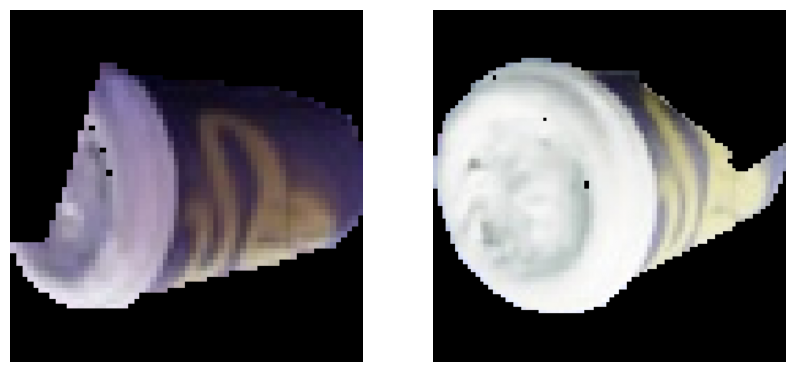

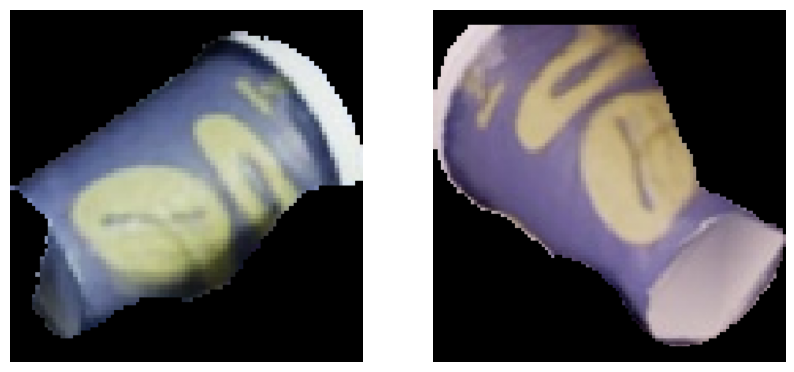

In [13]:
import matplotlib.pyplot as plt
for pair in train_postive_pairs[20:40]:
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(pair["img2"].permute(1,2,0))
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(pair["img1"].permute(1,2,0))
    plt.axis('off')

    plt.show()

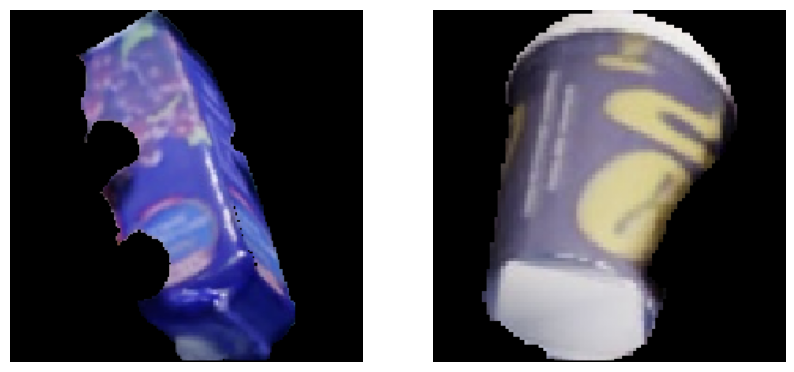

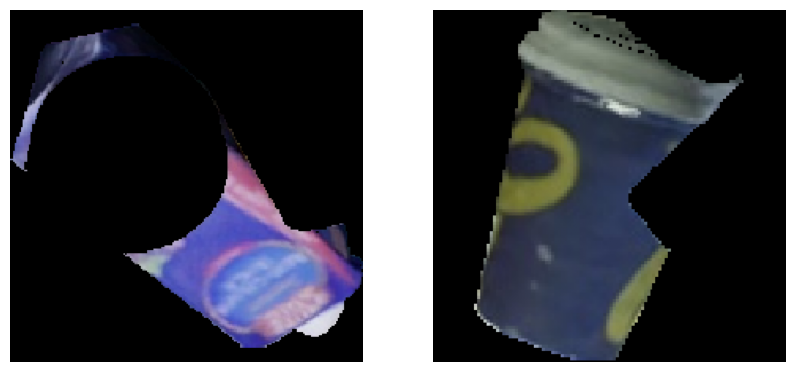

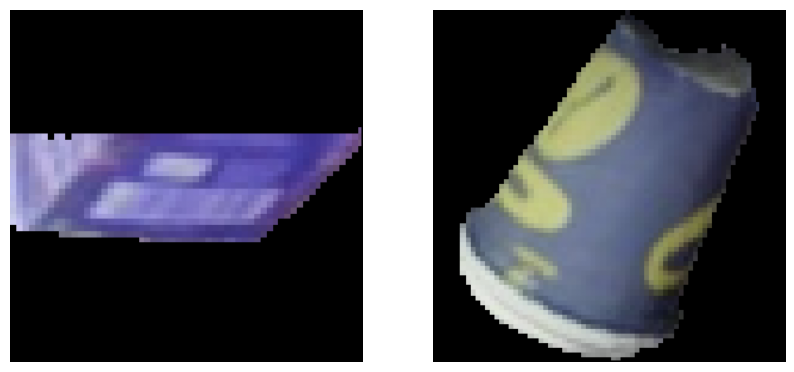

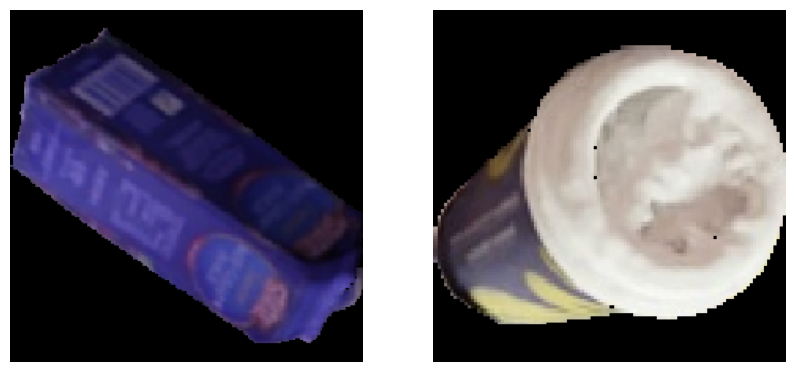

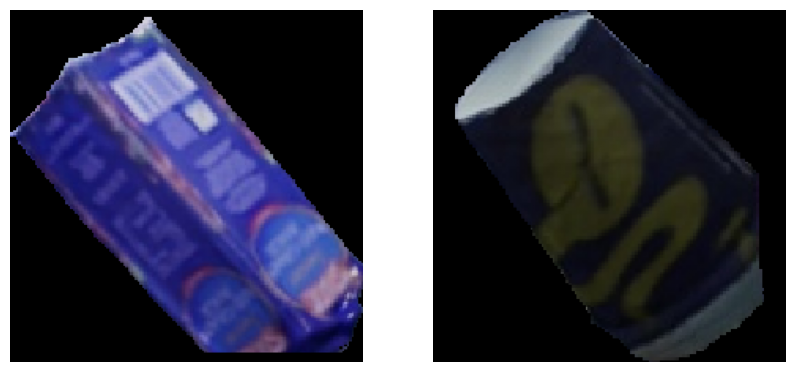

...

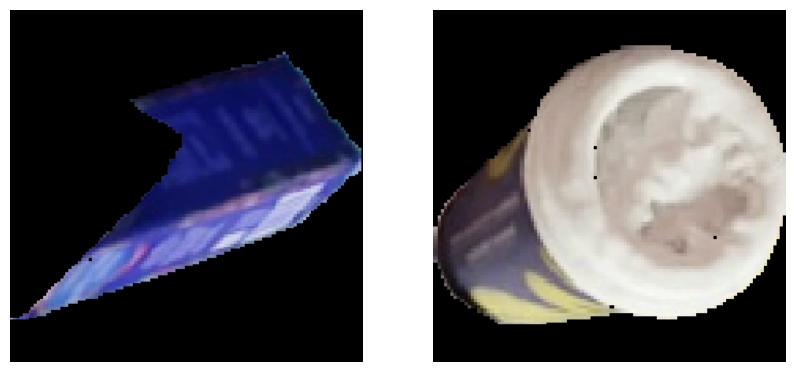

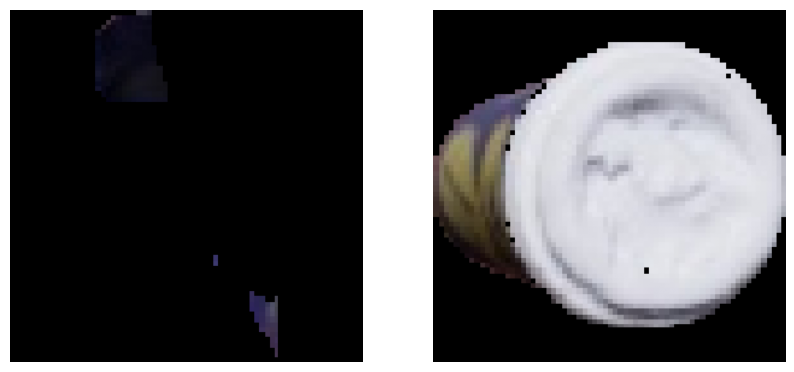

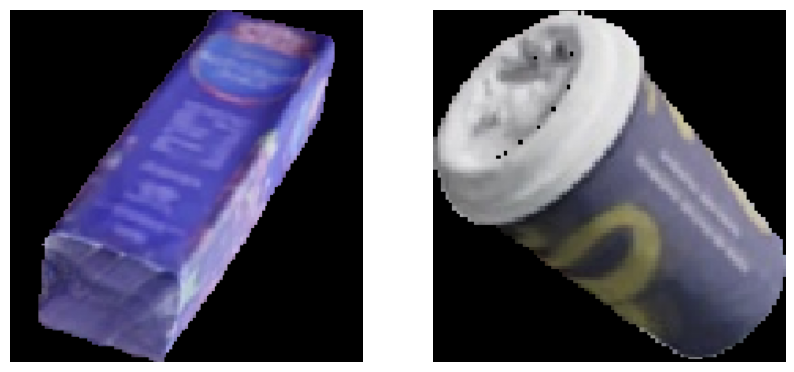

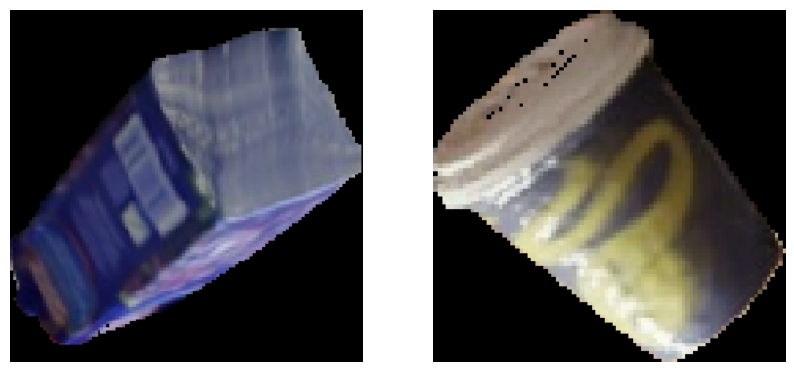

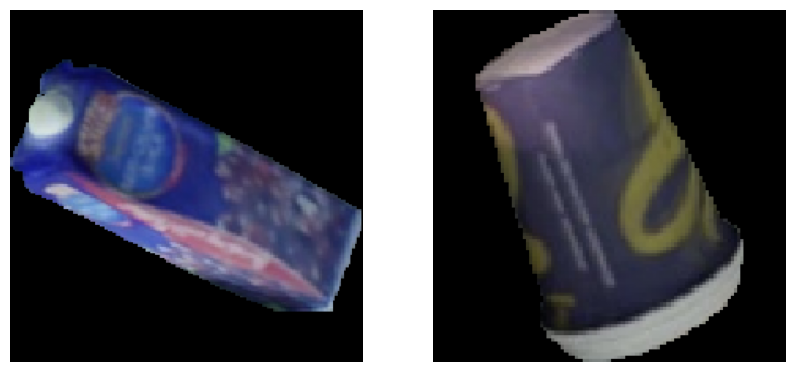

In [14]:
import matplotlib.pyplot as plt
for pair in train_negative_pairs[:40]:
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(pair["img1"].permute(1,2,0))
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(pair["img2"].permute(1,2,0))
    plt.axis('off')

    plt.show()

In [15]:
from torch.utils.data import DataLoader

train_loader = DataLoader(train_dataset, batch_size=4, shuffle=True, num_workers=4)
val_loader = DataLoader(val_dataset, batch_size=2, shuffle=True, num_workers=1)

In [16]:
# import torch
# import torch.optim as optim
# from tqdm import tqdm, trange
# import wandb
# from src.model.constrastive_learning import ContrastiveLoss

# wandb_run = wandb.init(project="cnos_contrastive_learning")
# model = model.to(device)
# criterion = ContrastiveLoss()
# optimizer = optim.Adam(model.parameters(), lr=0.001)
# # scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=10, gamma=0.2)

# num_epochs = 200
# # test_loader = DataLoader(test_dataset, batch_size=4, shuffle=True, num_workers=1)

# # return train_dataset, train_negative_pairs, train_postive_pairs
# # Training loop
# best_val_loss = float('inf')
# for epoch in trange(int(num_epochs), desc="Training"):
#     train_loss = 0.0
#     for batch in tqdm(train_loader, desc=f"Epoch {epoch + 1} in training", leave=False):
#         # import pdb; pdb.set_trace()
#         img1, img2, label = batch
#         img1, img2, label = img1.to(device), img2.to(device), label.to(device)
#         output1, output2 = model(img1), model(img2)
#         loss = criterion(output1, output2, label)
#         train_loss += loss.detach().cpu().item() / len(train_loader)
#         # print(f"train_loss: {train_loss}")
#         optimizer.zero_grad()
#         loss.backward()
#         optimizer.step()
#         del img1, img2, label, batch
#     print(f"Epoch {epoch + 1}/{num_epochs} loss: {train_loss:.5f}")
#     if epoch %5 == 0:
#         torch.save(model.state_dict(), f'contrastive_learning/saved_checkpoints/model_checkpoint'+str(epoch)+'.pth')

#     if epoch %3 == 0:
#         # Validation
#         val_loss = 0.0
#         model.eval()  #
#         with torch.no_grad():
#             for batch_val in tqdm(val_loader, desc=f"Epoch {epoch + 1} in validation", leave=False):
#                 img1_val, img2_val, label_val = batch_val
#                 img1_val, img2_val, label_val = img1_val.to(device), img2_val.to(device), label_val.to(device)
#                 output1_val, output2_val = model(img1_val), model(img2_val)
#                 loss = criterion(output1_val, output2_val, label_val)
#                 val_loss += loss.detach().cpu().item() / len(val_loader)
#                 del img1_val, img2_val, label_val, batch_val
#         print(f"Epoch {epoch + 1}/{num_epochs} Validation Loss: {val_loss:.5f}")
#         # Check if the validation loss is better than the best validation loss so far
#         if val_loss < best_val_loss:
#             # Update the best validation loss and save the model state
#             best_val_loss = val_loss
#             best_model_state = model.state_dict()
#             print("best_val_loss: ", best_val_loss)
#             print("saving best model at epoch: ", epoch)
#             torch.save(best_model_state, 'contrastive_learning/saved_checkpoints/best_model_checkpoint.pth')

#     wandb_run.log({
#         'train/epoch': epoch + 1,
#         'train/loss': train_loss,
#         'eval/loss' : val_loss,
#         'best_val_loss': best_val_loss
#     })

In [17]:
from src.model.constrastive_learning import train

train(device, model, train_dataset, val_dataset, test_dataset, num_epochs=50)

[2024-08-19 11:43:40,581] [ERROR] wandb.jupyter: Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: Currently logged in as: damvancuong510. Use `wandb login --relogin` to force relogin


Training:   0%|          | 0/50 [00:00<?, ?it/s][W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.
[W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.
[W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.
[W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.
/home/cuong.van-dam/miniconda3/envs/cnos/lib/python3.9/site-packages/xformers/ops/unbind.py:46: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  storage_data_ptr = tensors[0].storage().data_ptr()
/home/cuong.van-dam/miniconda3/envs/cnos/lib/python3.9/site-packages/xformers/ops/unbind.py:48: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only stor

Epoch 1/50 loss: 0.06763


[W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.


Epoch 1/50 Validation Loss: 0.00131
best_val_loss:  0.0013147730539078367
saving best model at epoch:  0


Training:   2%|▏         | 1/50 [03:08<2:34:08, 188.74s/it][W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.
[W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.
[W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.
[W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.
Training:   4%|▍         | 2/50 [06:02<2:24:04, 180.10s/it]

Epoch 2/50 loss: 0.05550


[W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.
[W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.
[W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.
[W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.
Training:   6%|▌         | 3/50 [08:56<2:18:57, 177.40s/it]

Epoch 3/50 loss: 0.03164


[W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.
[W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.
[W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.
[W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.


Epoch 4/50 loss: 0.02878


[W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.
Training:   8%|▊         | 4/50 [12:00<2:17:47, 179.72s/it]

Epoch 4/50 Validation Loss: 0.01335


[W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.
[W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.
[W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.
[W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.
Training:  10%|█         | 5/50 [14:54<2:13:13, 177.63s/it]

Epoch 5/50 loss: 0.03094


[W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.
[W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.
[W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.
[W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.


Epoch 6/50 loss: 0.00554


Training:  12%|█▏        | 6/50 [17:51<2:10:04, 177.37s/it][W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.
[W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.
[W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.
[W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.


Epoch 7/50 loss: 0.02677


[W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.
Training:  14%|█▍        | 7/50 [20:54<2:08:30, 179.31s/it]

Epoch 7/50 Validation Loss: 0.01631


[W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.
[W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.
[W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.
[W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.
Training:  16%|█▌        | 8/50 [23:48<2:04:18, 177.59s/it]

Epoch 8/50 loss: 0.01026


[W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.
[W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.
[W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.
[W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.
Training:  18%|█▊        | 9/50 [26:42<2:00:33, 176.42s/it]

Epoch 9/50 loss: 0.00085


[W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.
[W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.
[W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.
[W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.


Epoch 10/50 loss: 0.00007


[W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.


Epoch 10/50 Validation Loss: 0.00054
best_val_loss:  0.0005355514687397763
saving best model at epoch:  9


Training:  20%|██        | 10/50 [29:48<1:59:38, 179.46s/it][W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.
[W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.
[W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.
[W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.


Epoch 11/50 loss: 0.00003


Training:  22%|██▏       | 11/50 [32:44<1:56:04, 178.57s/it][W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.
[W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.
[W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.
[W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.
Training:  24%|██▍       | 12/50 [35:38<1:52:11, 177.13s/it]

Epoch 12/50 loss: 0.00001


[W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.
[W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.
[W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.
[W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.


Epoch 13/50 loss: 0.00001


[W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.


Epoch 13/50 Validation Loss: 0.00011
best_val_loss:  0.000111602673117184
saving best model at epoch:  12


Training:  26%|██▌       | 13/50 [38:44<1:50:54, 179.86s/it][W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.
[W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.
[W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.
[W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.
Training:  28%|██▊       | 14/50 [41:38<1:46:49, 178.03s/it]

Epoch 14/50 loss: 0.00001


[W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.
[W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.
[W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.
[W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.
Training:  30%|███       | 15/50 [44:32<1:43:07, 176.80s/it]

Epoch 15/50 loss: 0.00001


[W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.
[W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.
[W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.
[W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.


Epoch 16/50 loss: 0.00001


[W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.


Epoch 16/50 Validation Loss: 0.00006
best_val_loss:  6.074295228622356e-05
saving best model at epoch:  15


Training:  32%|███▏      | 16/50 [47:41<1:42:10, 180.31s/it][W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.
[W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.
[W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.
[W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.
Training:  34%|███▍      | 17/50 [50:34<1:38:06, 178.37s/it]

Epoch 17/50 loss: 0.00000


[W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.
[W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.
[W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.
[W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.
Training:  36%|███▌      | 18/50 [53:29<1:34:27, 177.12s/it]

Epoch 18/50 loss: 0.00000


[W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.
[W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.
[W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.
[W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.


Epoch 19/50 loss: 0.00000


[W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.
Training:  38%|███▊      | 19/50 [56:32<1:32:27, 178.95s/it]

Epoch 19/50 Validation Loss: 0.00013


[W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.
[W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.
[W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.
[W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.
Training:  40%|████      | 20/50 [59:26<1:28:41, 177.37s/it]

Epoch 20/50 loss: 0.00000


[W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.
[W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.
[W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.
[W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.


Epoch 21/50 loss: 0.00000


Training:  42%|████▏     | 21/50 [1:02:22<1:25:36, 177.11s/it][W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.
[W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.
[W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.
[W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.


Epoch 22/50 loss: 0.00000


[W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.
Training:  44%|████▍     | 22/50 [1:05:25<1:23:29, 178.91s/it]

Epoch 22/50 Validation Loss: 0.00118


[W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.
[W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.
[W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.
[W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.
Training:  46%|████▌     | 23/50 [1:08:19<1:19:48, 177.37s/it]

Epoch 23/50 loss: 0.00000


[W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.
[W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.
[W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.
[W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.
Training:  48%|████▊     | 24/50 [1:11:13<1:16:24, 176.31s/it]

Epoch 24/50 loss: 0.00000


[W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.
[W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.
[W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.
[W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.


Epoch 25/50 loss: 0.00000


[W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.
Training:  50%|█████     | 25/50 [1:14:16<1:14:19, 178.36s/it]

Epoch 25/50 Validation Loss: 0.00085


[W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.
[W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.
[W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.
[W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.


Epoch 26/50 loss: 0.00000


Training:  52%|█████▏    | 26/50 [1:17:13<1:11:07, 177.82s/it][W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.
[W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.
[W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.
[W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.
Training:  54%|█████▍    | 27/50 [1:20:06<1:07:41, 176.59s/it]

Epoch 27/50 loss: 0.00000


[W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.
[W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.
[W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.
[W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.


Epoch 28/50 loss: 0.00000


[W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.
Training:  56%|█████▌    | 28/50 [1:23:10<1:05:29, 178.61s/it]

Epoch 28/50 Validation Loss: 0.00011


[W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.
[W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.
[W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.
[W NNPACK.cpp:64] Could not initialize NNPACK! Reason: Unsupported hardware.
Training:  56%|█████▌    | 28/50 [1:23:51<1:05:52, 179.68s/it]


KeyboardInterrupt: 

# 3. Test

In [47]:
from tqdm import tqdm
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import torchvision.transforms as transforms
import torch.nn as nn
import glob
import torchvision.transforms as T
from src.model.constrastive_learning import ContrastiveModel, resize_and_pad_image

def reverse_normalization(normalized_output):
    mean = np.array([0.485, 0.456, 0.406]).reshape(3, 1, 1)
    std = np.array([0.229, 0.224, 0.225]).reshape(3, 1, 1)
    original_image = normalized_output * std + mean
    return np.clip(original_image, 0, 1)

transform = transforms.Compose(
        [
            transforms.ToTensor(),
            transforms.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
        ]
    )

model = ContrastiveModel(device)
model.load_state_dict(torch.load("contrastive_learning/saved_checkpoints/best_model_checkpoint.pth"))
model = model.to(device)

inv_rgb_transform = T.Compose(
        [
            T.Normalize(
                mean=[-0.485 / 0.229, -0.456 / 0.224, -0.406 / 0.225],
                std=[1 / 0.229, 1 / 0.224, 1 / 0.225],
            ),
        ]
    )

count_true = 0
count_false = 0
for i, test_data in enumerate(test_dataset):
    img1, img2, label = test_data
    img1, img2, label = img1.unsqueeze(0).float().to(device), img2.unsqueeze(0).float().to(device), label
    model.eval()
    with torch.no_grad():
        correct, total = 0, 0
        test_loss = 0.0
        
        outputs_test = model(img1, img2)
        _, predicted = torch.max(outputs_test.cpu(), 1)
        if predicted.item()==label:
            count_true +=1
        else:
            count_false +=1

        
        print(f"Prediction: {predicted} - GT : {label}")
        # plt.figure(figsize=(10, 5))
        # plt.subplot(1, 2, 1)
        # plt.imshow(np.array(reverse_normalization(img1.squeeze().cpu()).permute(1,2,0)))
        # plt.axis('off')

        # plt.subplot(1, 2, 2)
        # plt.imshow(np.array(reverse_normalization(img2.squeeze().cpu()).permute(1,2,0)))
        # plt.axis('off')

        # plt.show()

Using cache found in /home/cuong.van-dam/.cache/torch/hub/facebookresearch_dinov2_main
[2024-08-19 13:49:43,703] [INFO] dinov2: using MLP layer as FFN


Prediction: tensor([1]) - GT : 1
Prediction: tensor([1]) - GT : 1
Prediction: tensor([1]) - GT : 1
Prediction: tensor([1]) - GT : 1
Prediction: tensor([1]) - GT : 1
Prediction: tensor([1]) - GT : 1
Prediction: tensor([1]) - GT : 1
Prediction: tensor([1]) - GT : 1
Prediction: tensor([1]) - GT : 1
Prediction: tensor([1]) - GT : 1
Prediction: tensor([1]) - GT : 1
Prediction: tensor([1]) - GT : 1
Prediction: tensor([1]) - GT : 1
Prediction: tensor([1]) - GT : 1
Prediction: tensor([1]) - GT : 1
Prediction: tensor([1]) - GT : 1
Prediction: tensor([1]) - GT : 1
Prediction: tensor([1]) - GT : 1
Prediction: tensor([1]) - GT : 1
Prediction: tensor([1]) - GT : 1
Prediction: tensor([1]) - GT : 1
Prediction: tensor([1]) - GT : 1
Prediction: tensor([1]) - GT : 1
Prediction: tensor([1]) - GT : 1
Prediction: tensor([1]) - GT : 1
Prediction: tensor([1]) - GT : 1
Prediction: tensor([1]) - GT : 1
Prediction: tensor([1]) - GT : 1
Prediction: tensor([1]) - GT : 1
Prediction: tensor([1]) - GT : 1
Prediction

In [24]:
# from tqdm import tqdm
# import numpy as np
# import matplotlib.pyplot as plt
# from PIL import Image
# import torchvision.transforms as transforms
# import torch.nn as nn
# import glob

# from src.model.constrastive_learning import ContrastiveModel, resize_and_pad_image


# transform = transforms.Compose(
#         [
#             transforms.ToTensor(),
#             transforms.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
#         ]
#     )

# model = ContrastiveModel(device)
# model.load_state_dict(torch.load("contrastive_learning/saved_checkpoints/best_model_checkpoint.pth"))
# model = model.to(device)
# # criterion = ContrastiveLoss()

# template_paths = glob.glob("foundpose_analysis/icbin/templates/train_pbr_images_templates/obj_000001_original/*.png")
# templates = [np.array(Image.open(template_path).convert("RGB"))[:,:,:3]/255.0 for template_path in template_paths]

# proposal = np.array(neg[5]["rgb"])
# img1 = resize_and_pad_image(transform(proposal), target_max=224).unsqueeze(0).float().to(device)

# for temp in enumerate(templates):
#     img2 = resize_and_pad_image(transform(temp), target_max=224).unsqueeze(0).float().to(device)

#     model.eval()
#     with torch.no_grad():
#         correct, total = 0, 0
#         test_loss = 0.0
        
#         outputs_test = model(img1, img2)
#         _, predicted = torch.max(outputs_test, 1)

        
#         print(f"Dissimilarity score: {predicted}")
#         plt.figure(figsize=(10, 5))
#         plt.subplot(1, 2, 1)
#         plt.imshow(proposal)
#         plt.axis('off')

#         plt.subplot(1, 2, 2)
#         plt.imshow(temp)
#         plt.axis('off')

#         plt.show()
#         # neg_class = criterion(output1_test, output2_test, 0)
#         # pos_class = criterion(output1_test, output2_test, 1)
        
#         # print(f"neg_class : {neg_class}, pos_class: {pos_class}")
#         # if neg_class>0.5 and pos_class>0.5:
#         #     print(" Not able to identify - wrong case")
#         # if neg_class<0.5 and pos_class<0.5:
#         #     print(" Not able to identify - wrong case")
#         # elif neg_class>0.5:
#         #     print("proposal is negative")
#         # elif pos_class>0.5:
#         #     print("proposal is positive")

index 0


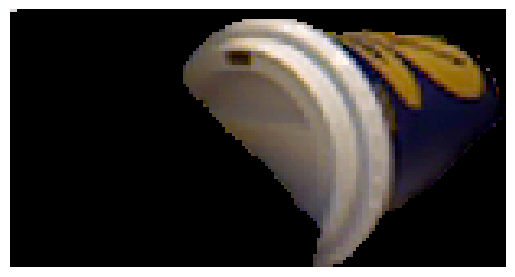

index 1


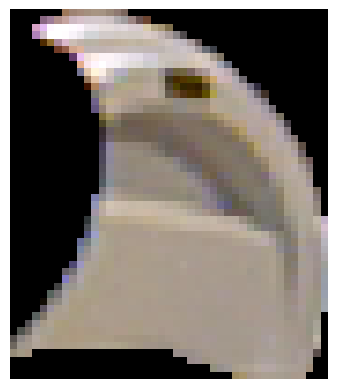

index 2


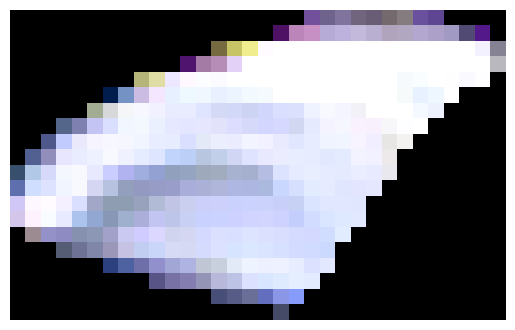

index 3


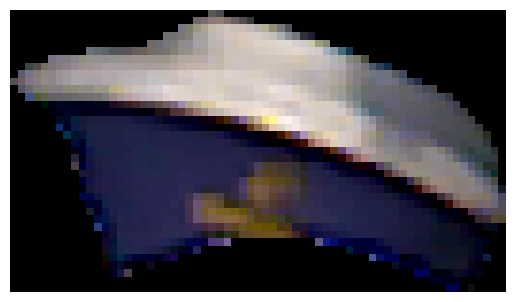

index 4


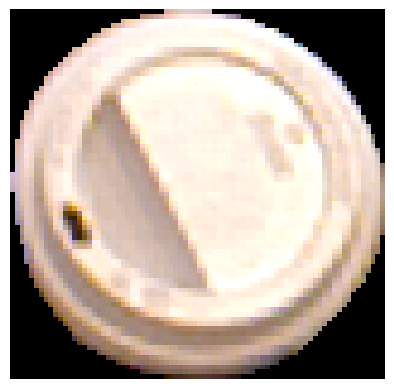

index 5


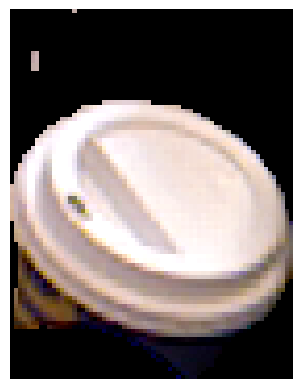

index 6


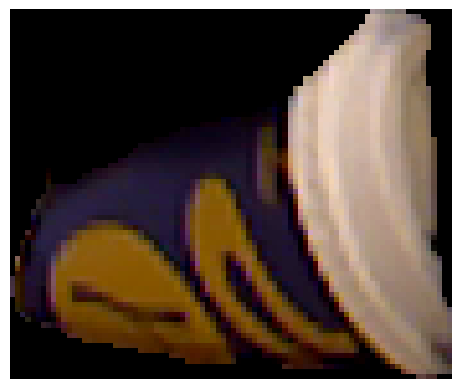

index 7


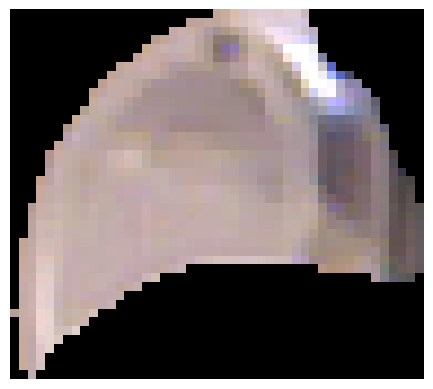

index 8


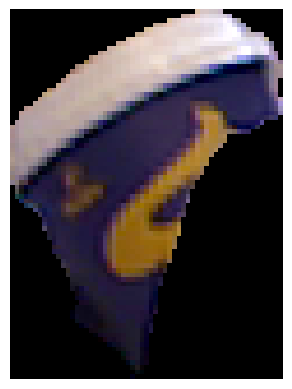

index 9


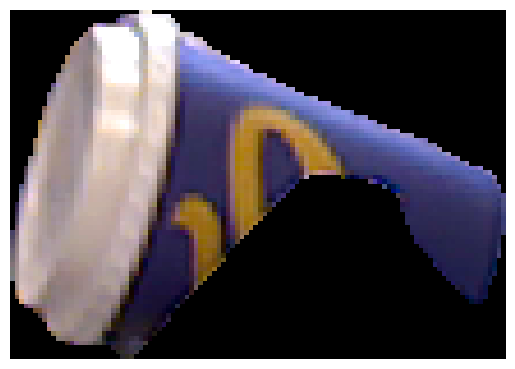

index 10


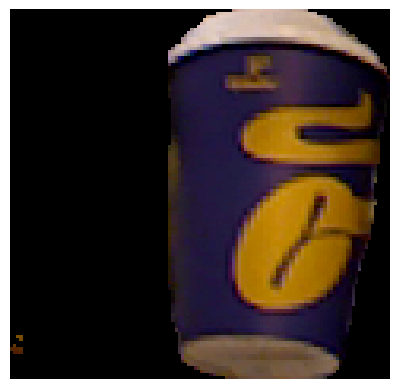

index 11


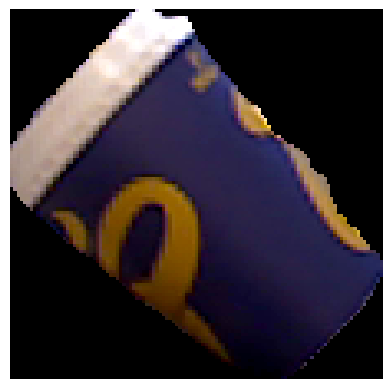

index 12


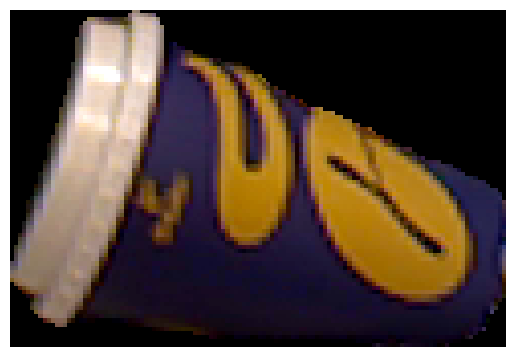

index 13


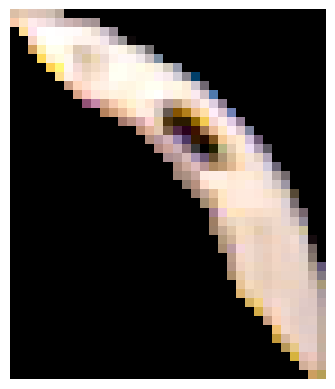

index 14


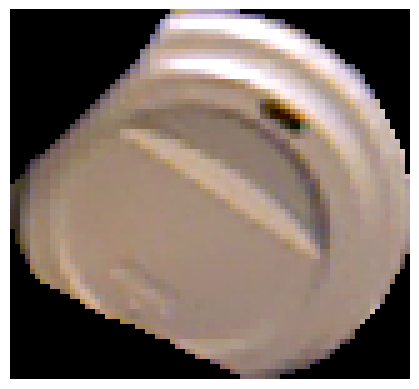

index 15


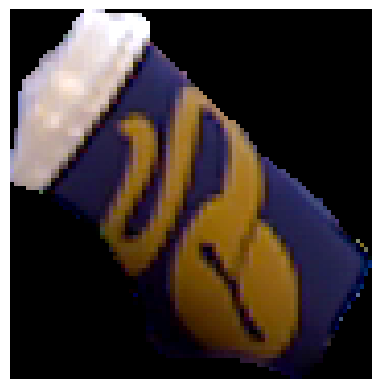

index 16


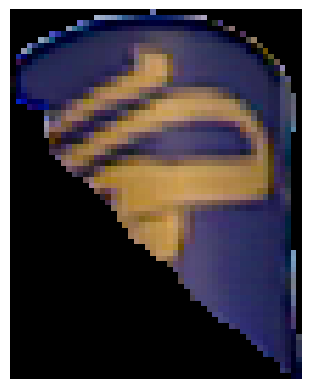

index 17


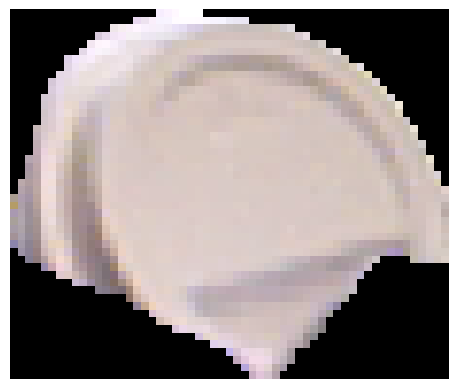

index 18


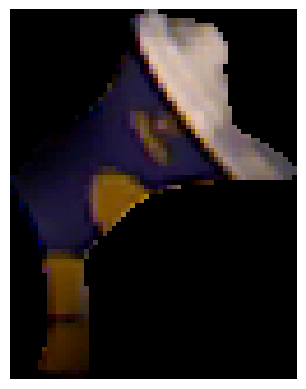

index 19


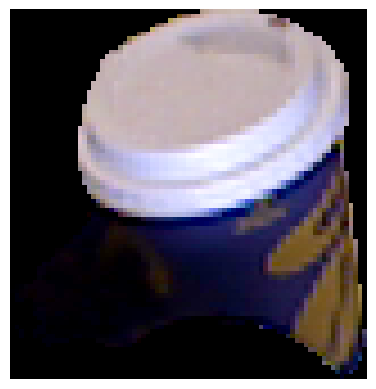

index 20


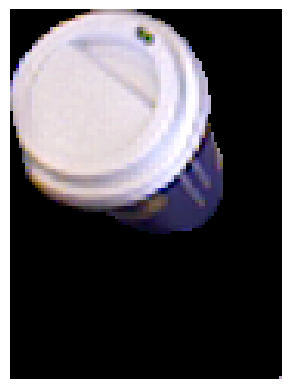

index 21


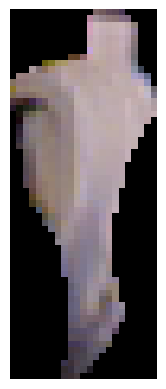

index 22


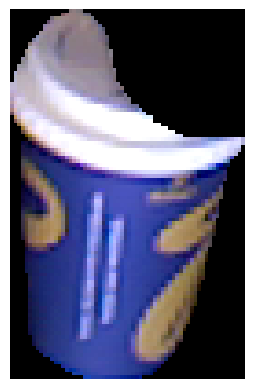

index 23


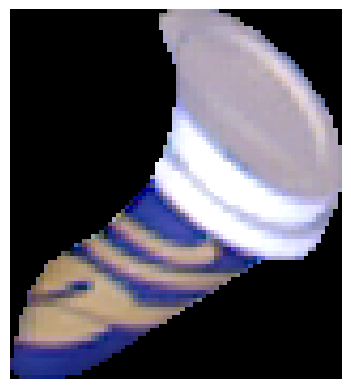

index 24


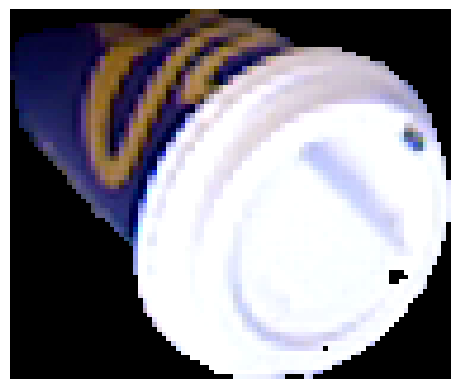

index 25


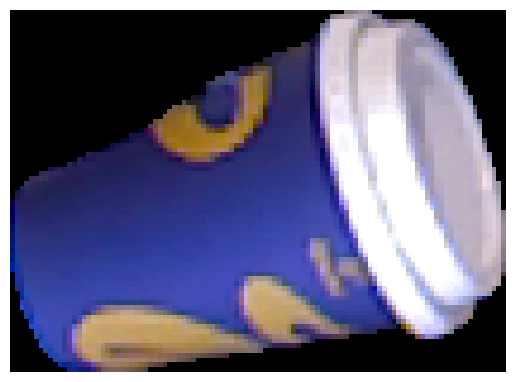

index 26


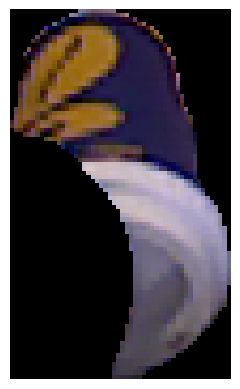

index 27


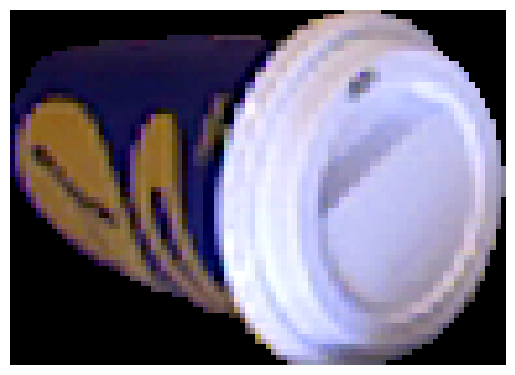

index 28


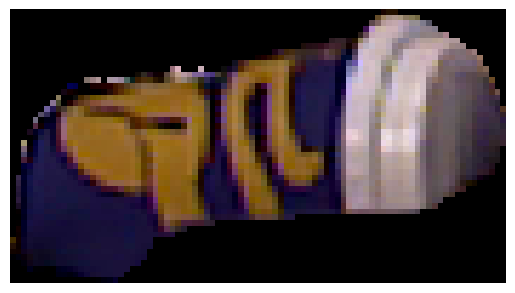

index 29


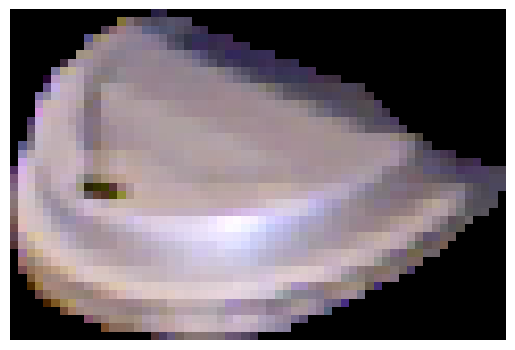

index 30


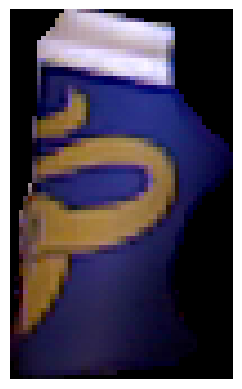

index 31


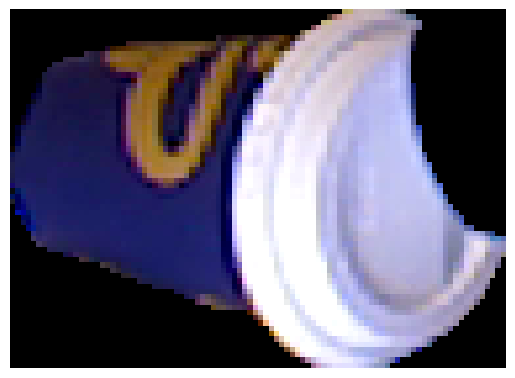

index 32


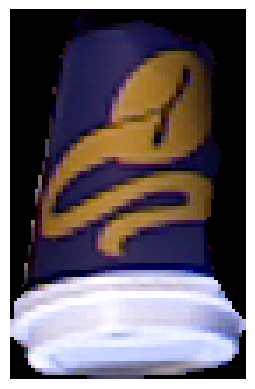

index 33


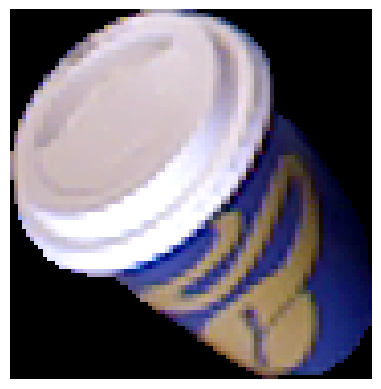

index 34


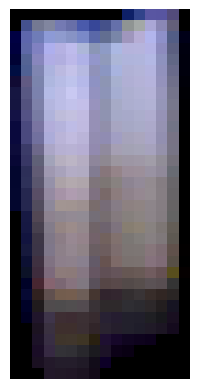

index 35


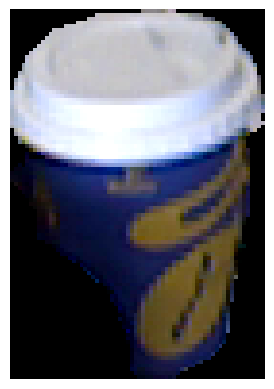

index 36


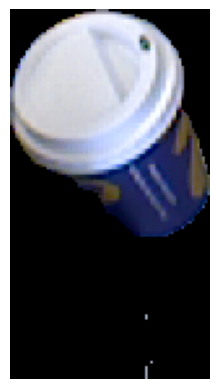

index 37


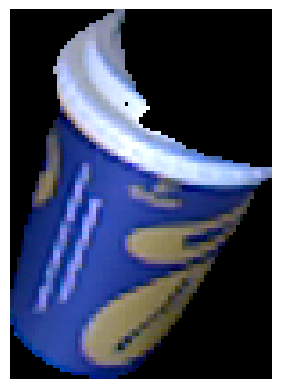

index 38


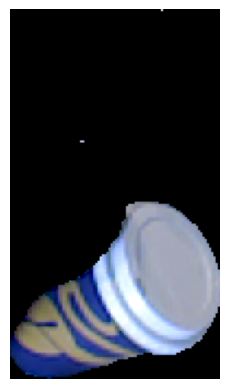

index 39


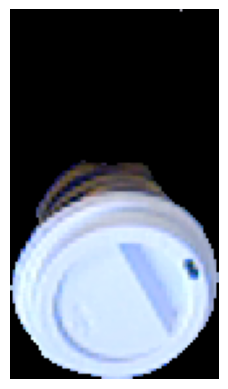

index 40


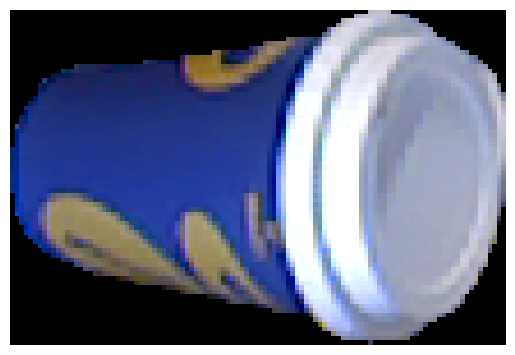

index 41


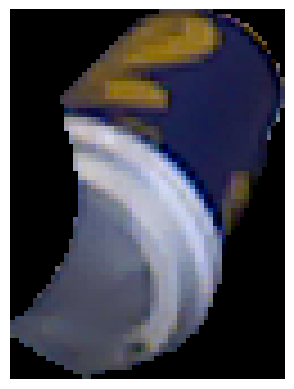

index 42


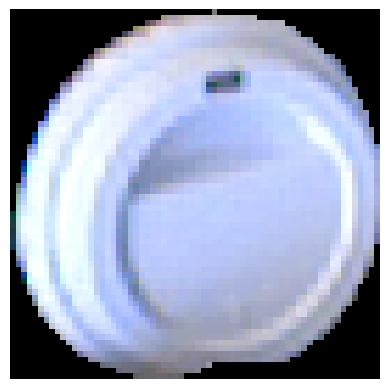

index 43


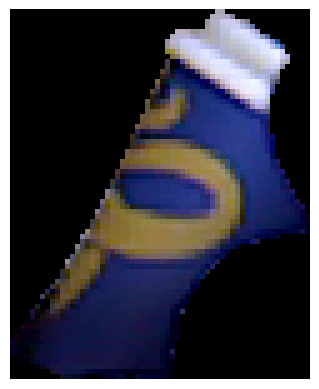

index 44


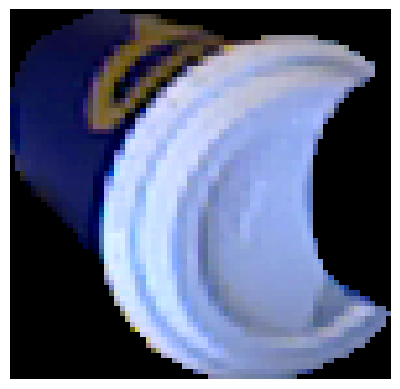

In [ ]:
for i, proposal in enumerate(pos[45:90]):
    proposal = np.array(proposal["rgb"])
    print("index", i)
    plt.imshow(proposal)
    plt.axis('off')  # Optional: Turn off the axis
    plt.show()

In [ ]:
neg_class = criterion(output1_test, output2_test, 0)
pos_class = criterion(output1_test, output2_test, 1)

In [ ]:
neg_class

tensor(0.6837, device='cuda:0')

# 7. Nhap

In [ ]:
import torch.nn as nn
class ContrastiveLoss2(nn.Module):
    def __init__(self, margin=1.0):
        super().__init__() 
        self.margin = margin

    def forward(self, output1, output2, label):
        # Calculate Euclidean distance
        euclidean_distance = nn.functional.pairwise_distance(output1, output2)
        # Calculate loss
        loss_contrastive = torch.mean(
            label * torch.pow(euclidean_distance, 2) +
            (1 - label) * torch.pow(torch.clamp(self.margin - euclidean_distance, min=0.0), 2)
        ) # without means it return size (B) as score for each pair in img1 and img2

        return loss_contrastive

loss = ContrastiveLoss2()

import torch

img1 = torch.randn(4,1024)
img2 = torch.randn(4,1024)
label = torch.tensor([1,0,0,0])

l = loss(img1, img2, label)

In [ ]:
l

tensor(540.8006)

In [ ]:
# def pose_similarity(given_pose, poses):
#     R_given, t_given = np.array(given_pose[:3, :3]), np.array(given_pose[:3, 3])
#     similarities = []

#     for idx, pose in enumerate(poses):
#         R, t = np.array(pose[:3, :3]), np.array(pose[:3, 3])
        
#         # Calculate Euclidean distance for translation
#         translation_dist = np.linalg.norm(t_given - t)
        
#         # Calculate Frobenius norm for rotation
#         rotation_dist = np.linalg.norm(R_given - R, ord='fro')

#         # Total similarity measure (you can adjust the weights if needed)
#         total_dist = translation_dist + rotation_dist
#         similarities.append((total_dist, idx))

#     # Sort by similarity (lower distance means more similar)
#     similarities.sort()

#     return similarities

# given_pose = pos_proposals[0][0]["pose"]
# poses = templates["poses"]
# similarity_scores = pose_similarity(given_pose, poses)
# top_5_similar = similarity_scores[:5]

In [ ]:
# from scipy.spatial.distance import cdist
# from scipy.spatial.transform import Rotation
# import matplotlib.pyplot as plt

# def compute_inplane(rot_query_openCV, rot_template_openCV):
#     delta = rot_template_openCV.dot(rot_query_openCV.T)
#     inp = extract_inplane_from_pose(delta)
#     # double check to make sure that reconved rotation is correct
#     R_inp = convert_inplane_to_rotation(inp)
#     recovered_R1 = R_inp.dot(rot_template_openCV)
#     err = geodesic_numpy(recovered_R1, rot_query_openCV)
#     if err >= 15:
#         print("WARINING, error of recovered pose is >=15, err=", err)
#     return inp

# def opencv2opengl(cam_matrix_world):
#     transform = np.array([[1, 0, 0, 0], [0, -1, 0, 0], [0, 0, -1, 0], [0, 0, 0, 1]])
#     if len(cam_matrix_world.shape) == 2:
#         return np.matmul(transform, cam_matrix_world)
#     else:
#         transform = np.tile(transform, (cam_matrix_world.shape[0], 1, 1))
#         return np.matmul(transform, cam_matrix_world)

# def extract_inplane_from_pose(pose):
#     inp = Rotation.from_matrix(pose).as_euler("zyx", degrees=True)[0]
#     return inp

# def convert_inplane_to_rotation(inplane):
#     R_inp = Rotation.from_euler("z", -inplane, degrees=True).as_matrix()
#     return R_inp

# def geodesic_numpy(R1, R2):
#     theta = (np.trace(R2.dot(R1.T)) - 1) / 2
#     theta = np.clip(theta, -1, 1)
#     return np.degrees(np.arccos(theta))

# def extract_positive_pairs(all_pos_proposals)
#     pos_pairs = list()
#     for proposals_id in range(len(all_pos_proposals)):
#         obj_query_pose = all_pos_proposals[proposals_id]["pose"][None]
#         obj_template_poses = templates["poses"]

#         return_inplane = True

#         obj_query_openGL_pose = opencv2opengl(obj_query_pose)
#         obj_query_openGL_location = obj_query_openGL_pose[:, 2, :3]  # Mx3 # (translation components) -  It assumes that the 3D location is found in the third column of the pose matrices.
#         obj_template_openGL_poses = opencv2opengl(obj_template_poses)
#         obj_template_openGL_locations = obj_template_openGL_poses[:, 2, :3]  # Nx3 # (translation components)

#         # find the nearest template
#         # It computes the pairwise distances between each query pose location and each template pose location using cdist.
#         distances = cdist(obj_query_openGL_location, obj_template_openGL_locations)
#         best_index_in_pose_distribution = np.argmin(distances, axis=-1)  # M
#         if return_inplane:
#             nearest_poses = obj_template_poses[best_index_in_pose_distribution]
#             inplanes = np.zeros(len(obj_query_pose))
#             for idx in range(len(obj_query_pose)):
#                 rot_query_openCV = obj_query_pose[idx, :3, :3]
#                 rot_template_openCV = nearest_poses[idx, :3, :3]
#                 inplanes[idx] = compute_inplane(rot_query_openCV, rot_template_openCV)
#         #     return self.avail_index[best_index_in_pose_distribution], inplanes #  self.avail_index is just the index from 0 to 42

#         pos_pair = {
#             "img1" : templates["rgb"][best_index_in_pose_distribution[0]],
#             "img2" : all_pos_proposals[proposals_id]["rgb"],
#             "label" : 1
#         }
#         pos_pairs.append(pos_pair)
#         # plt.figure(figsize=(10, 5))
#         # plt.subplot(1, 2, 1)
#         # plt.imshow(templates["rgb"][best_index_in_pose_distribution[0]])
#         # plt.axis('off')

#         # plt.subplot(1, 2, 2)
#         # plt.imshow(all_pos_proposals[proposals_id]["rgb"])
#         # plt.axis('off')

#         # plt.show()
#     return pos_pairs